In [133]:
import pymysql
from collections import defaultdict
import pandas as pd
import sqlalchemy
%matplotlib inline
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from colormaps import *

In [30]:
    # Database connection
    conn = pymysql.connect(user='root', password='root', database='acb', host='localhost')

    # Load the data into a Pandas DataFrame
    query = "select * from shotchart"
    shot_df = pd.read_sql(query, conn)
    shot_df
    
    # Load the data into a Pandas DataFrame
    query = "select * from teamname"
    team_df = pd.read_sql(query, conn)

In [31]:
# View the head of the DataFrame and all its columns
from IPython.display import display
with pd.option_context('display.max_columns', None):
    display(shot_df.head())

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,botton_px,left_px,botton_px_adjust,left_px_adjust,left_m_adjust,botton_m_adjust,distance
0,1,978012,63149,15,167,52,1,1,2PT,jumpshot,46.259,85.610,53.741,14.390,4.02920,8.06115,2.517536
1,2,978012,63149,15,159,9,0,1,3PT,None,13.946,74.317,86.054,25.683,7.19124,12.90810,7.796775
2,3,978012,63149,15,163,21,1,1,2PT,jumpshot,61.905,89.071,38.095,10.929,3.06012,5.71425,2.322603
3,4,978012,63149,15,163,21,1,1,3PT,None,64.286,69.399,35.714,30.601,8.56828,5.35710,7.314232
4,5,978012,63149,15,160,12,0,1,3PT,None,3.401,91.985,96.599,8.015,2.24420,14.48985,7.021811


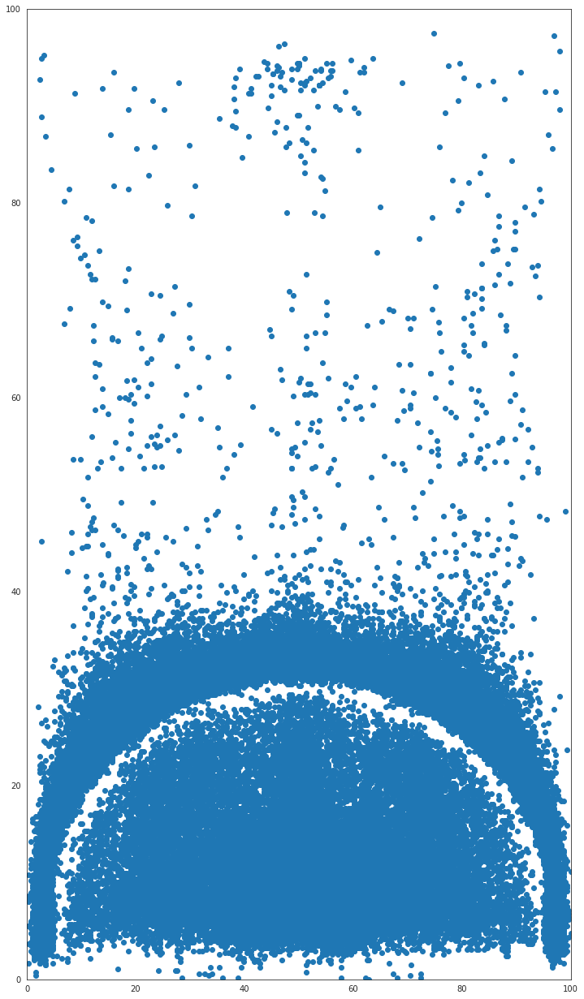

In [32]:
sns.set_style("white")
sns.set_color_codes()
plt.figure(figsize=(12,22))
plt.scatter(shot_df.botton_px_adjust, shot_df.left_px_adjust)
plt.xlim(0,100)
plt.ylim(0,100)
plt.show()

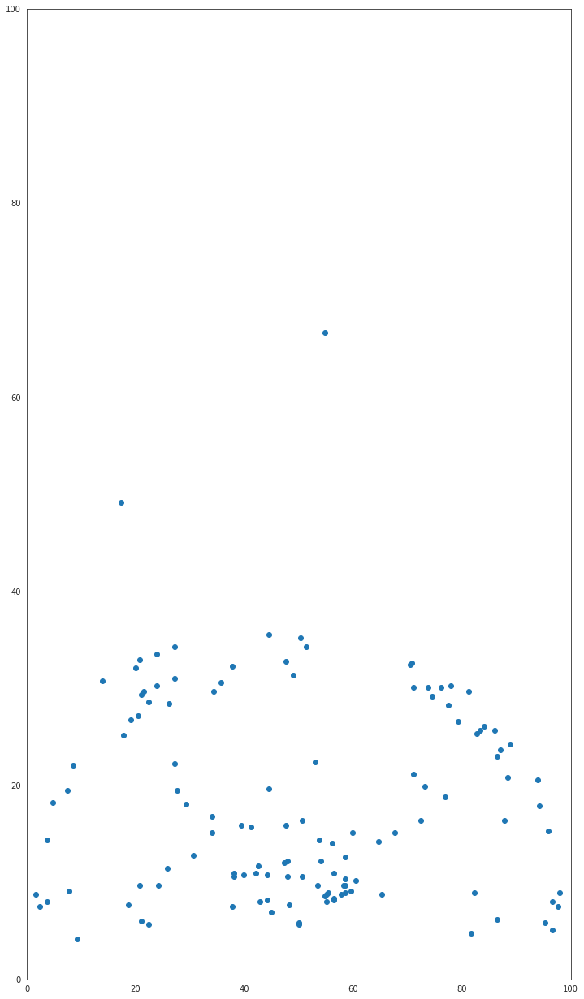

In [33]:
team_shotchart = shot_df[shot_df.game_acbid == 63149]

sns.set_style("white")
sns.set_color_codes()
plt.figure(figsize=(12,22))
plt.scatter(team_shotchart.botton_px_adjust, team_shotchart.left_px_adjust)
plt.xlim(0,100)
plt.ylim(0,100)
plt.show()

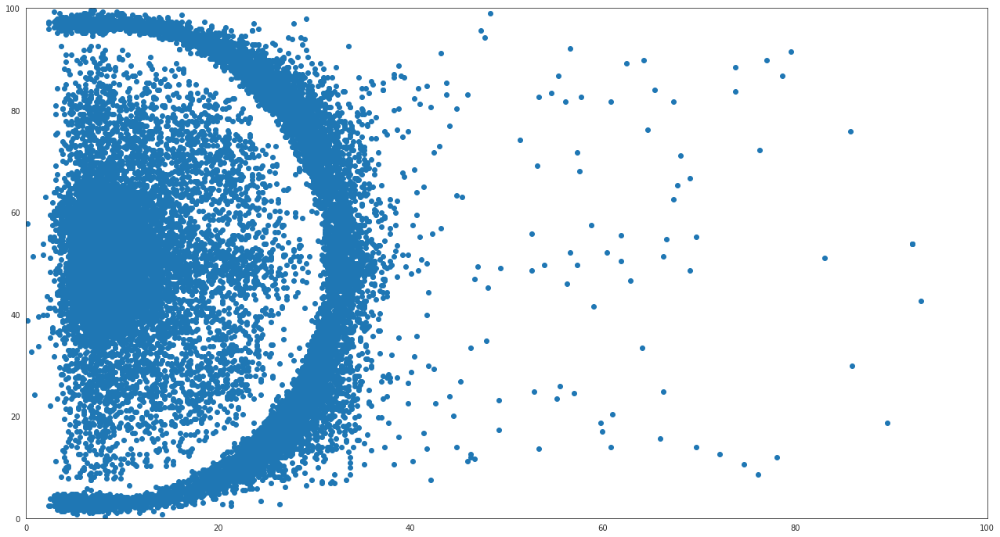

In [34]:
actor_shotchart = shot_df[shot_df.game_acbid>63000]

sns.set_style("white")
sns.set_color_codes()
plt.figure(figsize=(22,12))
plt.scatter( actor_shotchart.left_px_adjust,actor_shotchart.botton_px_adjust)
plt.xlim(0,100)
plt.ylim(0,100)

plt.show()

Populating the interactive namespace from numpy and matplotlib


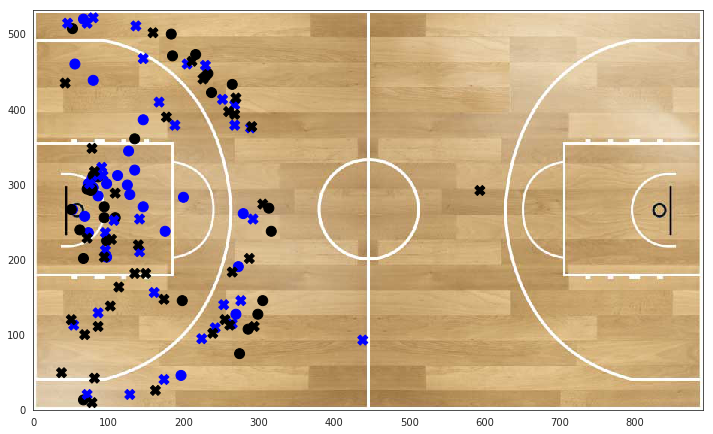

In [35]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('fiba_courtonly.png')

game_shotchart = shot_df[shot_df.game_acbid == 63149]
teams=game_shotchart.team_id.unique()

colors = np.where(team_shotchart.team_id==teams[0],'blue','black')
aux1=game_shotchart[game_shotchart['scored']==1]
aux2=game_shotchart[game_shotchart['scored']==0]
colors1=np.where(aux1.team_id==teams[0],'blue','black')
colors2=np.where(aux2.team_id==teams[0],'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux1.left_px_adjust*img.shape[1]/100,aux1.botton_px_adjust*img.shape[0]/100,c=colors1,marker='o',s=100)
plt.scatter(aux2.left_px_adjust*img.shape[1]/100,aux2.botton_px_adjust*img.shape[0]/100,c=colors2,marker='X',s=100)

imgplot = plt.imshow(img, origin='lower')
plt.show()

Populating the interactive namespace from numpy and matplotlib


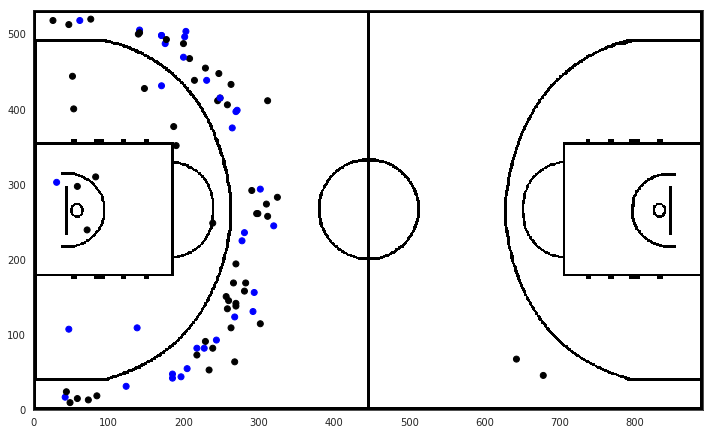

891

In [36]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('fiba_courtonly_cut_WB.png')

aux_df=shot_df[(shot_df.actor_id==15) & (shot_df.game_acbid>=63000)]
aux_df

colors1=np.where(aux_df['scored']==1,'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, c=colors1)

imgplot = plt.imshow(img, origin='lower')
plt.show()
img.shape[0]
img.shape[1]

Populating the interactive namespace from numpy and matplotlib


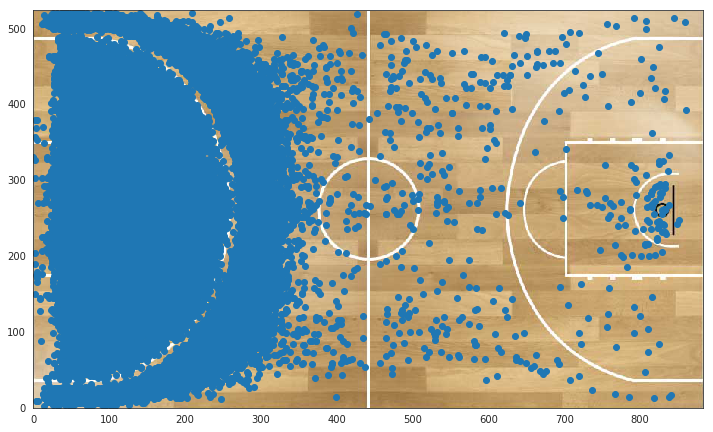

883

In [37]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('fiba_courtonly_cut.png')

aux_df=shot_df[shot_df.botton_px_adjust<0.5]
aux_df

plt.figure(figsize=(12,22))
plt.scatter(shot_df.left_px_adjust*img.shape[1]/100,shot_df.botton_px_adjust*img.shape[0]/100)
imgplot = plt.imshow(img, origin='lower')
plt.show()
img.shape[0]
img.shape[1]

(532, 891, 3)
AxesSubplot(0.119401,0.0988571;0.706248x0.723368)


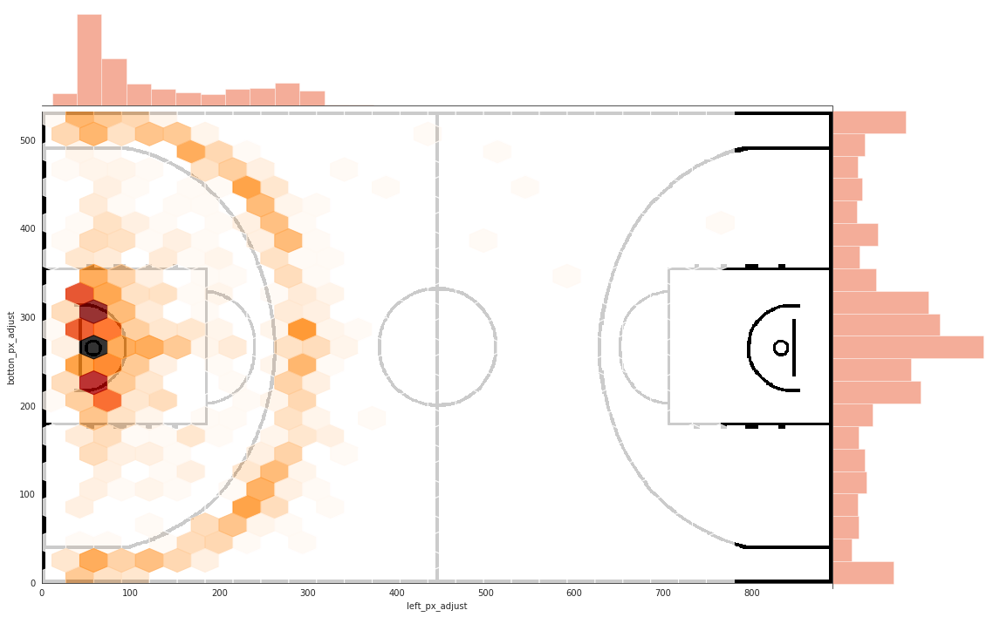

In [129]:
from matplotlib.offsetbox import  OffsetImage

# create our jointplot
aux_df=shot_df[(shot_df.team_id==1) & (shot_df.game_acbid>=63000)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')
print(img.shape)

cmap=plt.cm.gist_heat_r

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='hex', space=0, color=cmap(0.4),
                                 cmap=cmap, alpha=0.8,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]])

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
print(ax)
ax.imshow(img, origin='lower')



plt.show()

(532, 891, 3)
AxesSubplot(0.119401,0.0988571;0.706248x0.723368)


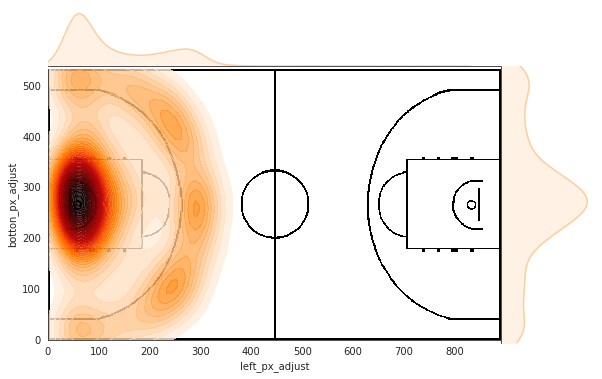

In [39]:
from matplotlib.offsetbox import  OffsetImage

# create our jointplot
aux_df=shot_df[(shot_df.team_id==1) & (shot_df.game_acbid>=63000)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')
print(img.shape)

cmap=plt.cm.gist_heat_r

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde', space=0, color=cmap(0.1),
                                 cmap=cmap,n_levels=50, alpha=0.8,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"shade_lowest":False})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100)
joint_shot_chart.fig.set_figheight(img.shape[0]/100)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
print(ax)
ax.imshow(img, origin='lower')



plt.show()

(524, 883, 3)
AxesSubplot(0.119401,0.0988571;0.706248x0.723368)


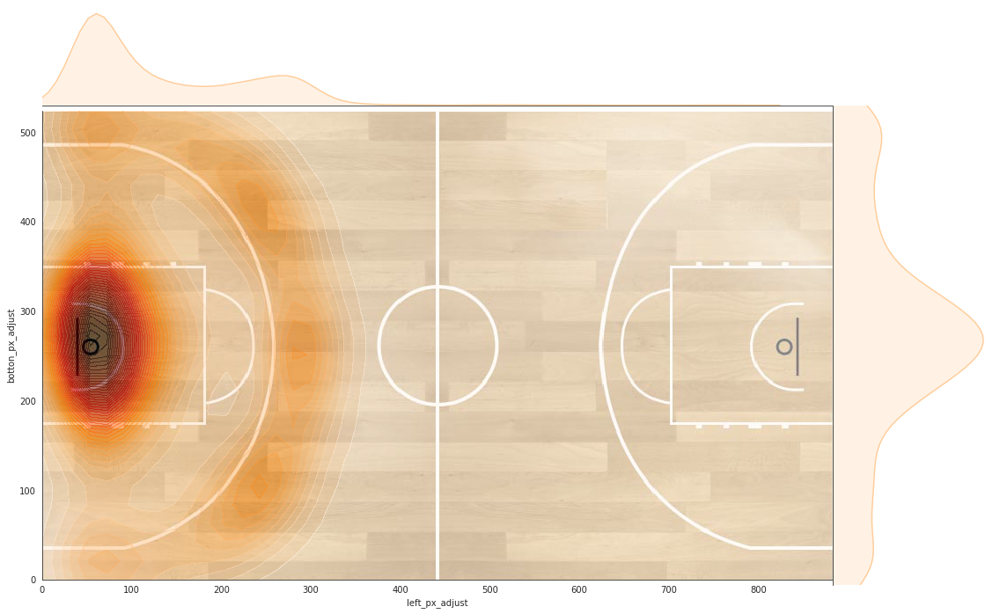

In [18]:
from matplotlib.offsetbox import  OffsetImage

# create our jointplot
aux_df=shot_df[(shot_df.team_id==1) & (shot_df.game_acbid>=63000)]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')
print(img.shape)

cmap=plt.cm.gist_heat_r

# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde', space=0, color=cmap(0.1),
                                 cmap=cmap,n_levels=50, alpha=0.5,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":20})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint
print(ax)
ax.imshow(img, origin='lower')



plt.show()

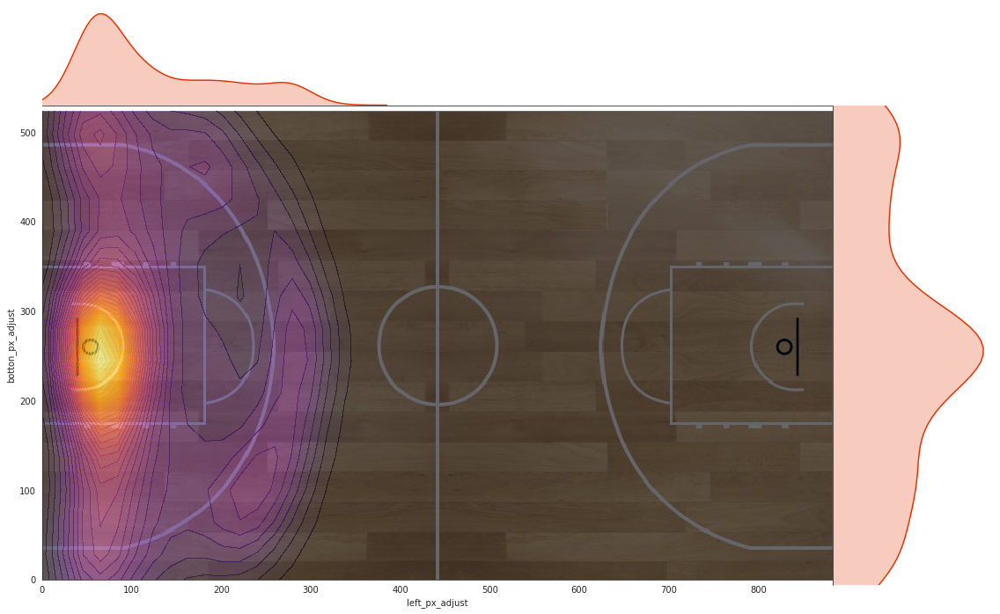

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,botton_px,left_px,botton_px_adjust,left_px_adjust,left_m_adjust,botton_m_adjust,distance
462,463,977779,63010,1,2,3,1,1,3PT,None,77.891,72.860,22.109,27.140,7.59920,3.31635,7.334433
464,465,977779,63010,1,2,3,0,1,3PT,None,17.347,75.592,82.653,24.408,6.83424,12.39795,7.186760
476,477,977779,63010,1,2,3,1,2,2PT,jumpshot,14.966,86.703,85.034,13.297,3.72316,12.75510,5.677206
482,483,977779,63010,1,2,3,0,2,3PT,None,71.429,69.945,28.571,30.055,8.41540,4.28565,7.557984
485,486,977779,63010,1,2,3,1,2,2PT,jumpshot,91.837,94.718,8.163,5.282,1.47896,1.22445,6.276285
487,488,977779,63010,1,2,3,1,2,2PT,dunk,50.340,94.353,49.660,5.647,1.58116,7.44900,0.051371
488,489,977779,63010,1,2,3,0,2,2PT,jumpshot,64.286,93.260,35.714,6.740,1.88720,5.35710,2.165523
489,490,977779,63010,1,2,3,1,2,2PT,layup,54.082,93.443,45.918,6.557,1.83596,6.88770,0.665591
508,509,977779,63010,1,2,3,1,3,3PT,None,17.347,25.319,17.347,25.319,7.08932,2.60205,7.375476
660,661,977769,63001,1,2,3,0,1,3PT,None,96.259,89.800,3.741,10.200,2.85600,0.56115,7.056104


In [137]:
from matplotlib.offsetbox import  OffsetImage
import palettable


# create our jointplot
aux_df=shot_df[(shot_df.actor_id==2) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
viridis = ListedColormap(_magma_data, name='viridis')


# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(0.4),
                                 cmap=inferno, n_levels=30,alpha=0.6,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')



plt.show()
aux_df

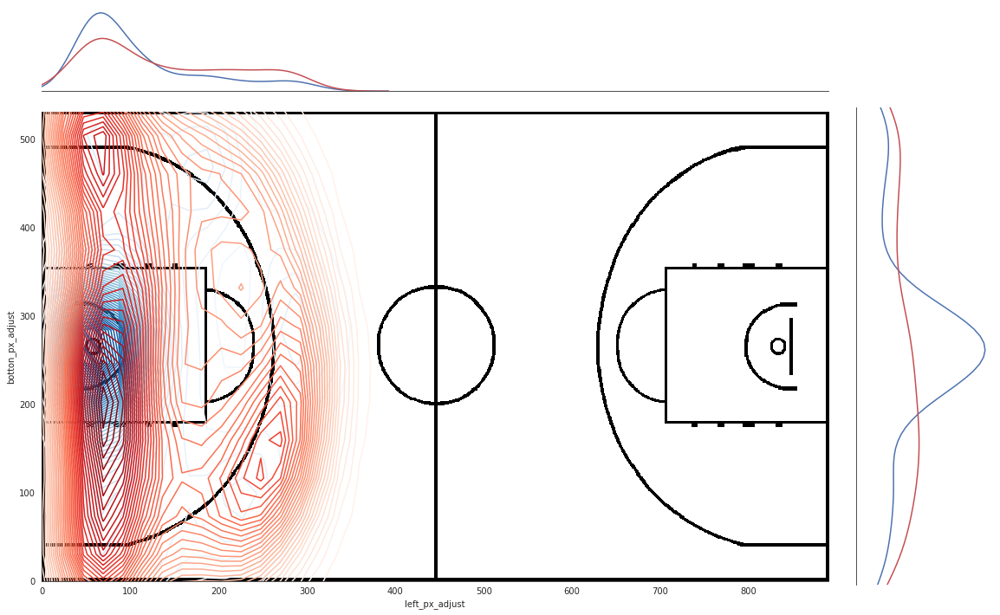

In [119]:
from matplotlib.offsetbox import  OffsetImage
import palettable

# create our jointplot
aux_df_scored=shot_df[(shot_df.actor_id==2)&(shot_df.scored==1)]
aux_df
aux_df_missed=shot_df[(shot_df.actor_id==2)&(shot_df.scored==0)]

# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut_WB.png')

# construct cmap
# Register and set Viridis as the colormap for the plot
viridis = ListedColormap(_viridis_data, name='viridis')


# n_levels sets the number of contour lines for the main kde plot
g = sns.JointGrid(x="left_px_adjust",y="botton_px_adjust",data=aux_df)

sns.kdeplot(aux_df_scored.left_px_adjust*img.shape[1]/100, aux_df_scored.botton_px_adjust*img.shape[0]/100, cmap="Blues",
            n_levels=50, shade_lowest=True, ax=g.ax_joint,cut=30)

sns.kdeplot(aux_df_missed.left_px_adjust*img.shape[1]/100, aux_df_missed.botton_px_adjust*img.shape[0]/100, cmap="Reds",
            n_levels=50, shade_lowest=True, ax=g.ax_joint,cut=30)

sns.kdeplot(aux_df_scored.left_px_adjust*img.shape[1]/100, color="b", legend=False,  
             ax=g.ax_marg_x)
sns.kdeplot(aux_df_missed.left_px_adjust*img.shape[1]/100, color="r", legend=False, 
             ax=g.ax_marg_x)
sns.kdeplot(aux_df_scored.botton_px_adjust*img.shape[0]/100, color="b", legend=False, 
             ax=g.ax_marg_y, vertical=True)
sns.kdeplot(aux_df_missed.botton_px_adjust*img.shape[0]/100, color="r", legend=False, 
             ax=g.ax_marg_y, vertical=True)

g.fig.set_figwidth(img.shape[1]/100*2)
g.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = g.ax_joint

ax.imshow(img, origin='lower')



plt.show()

In [42]:
teams=df_season['team_id'].unique()
for team in teams:
    team_name=team_df.name[(team_df.team_id==team)].iloc[-1]
    print(team_name)

CAFÉS CANDELAS BREOGÁN
VALENCIA BASKET
MOVISTAR ESTUDIANTES
IBEROSTAR TENERIFE
UNIVERSIDAD CATÓLICA DE MURCIA
SAN PABLO BURGOS
REAL MADRID
HERBALIFE GRAN CANARIA
KIROLBET BASKONIA
MONBUS OBRADOIRO
DELTECO GBC
TECNYCONTA ZARAGOZA
MORABANC ANDORRA
BARÇA LASSA
UNICAJA
BAXI MANRESA
MONTAKIT FUENLABRADA
DIVINA SEGUROS JOVENTUT


/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


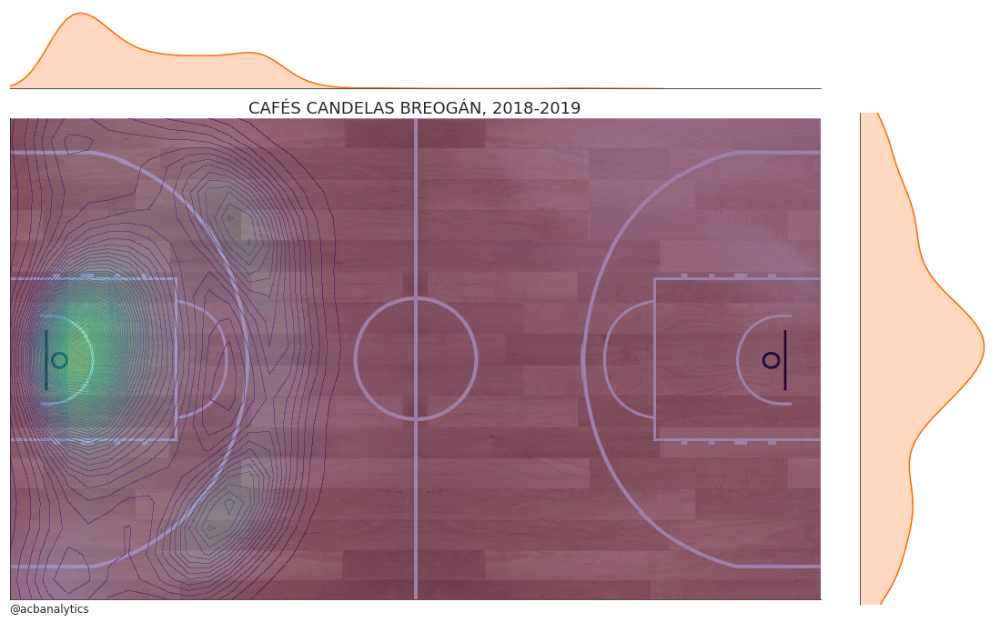

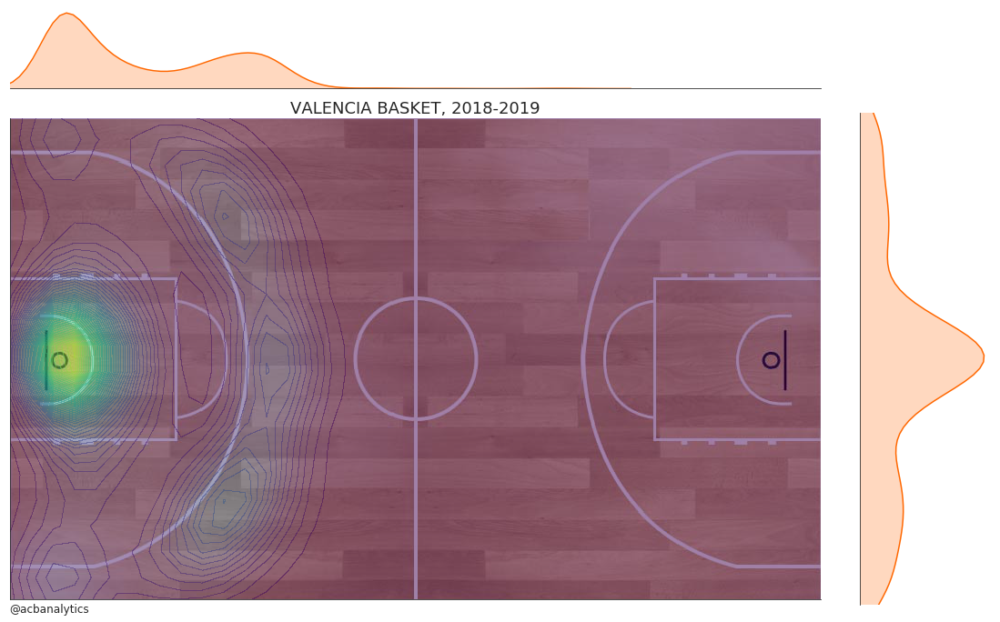

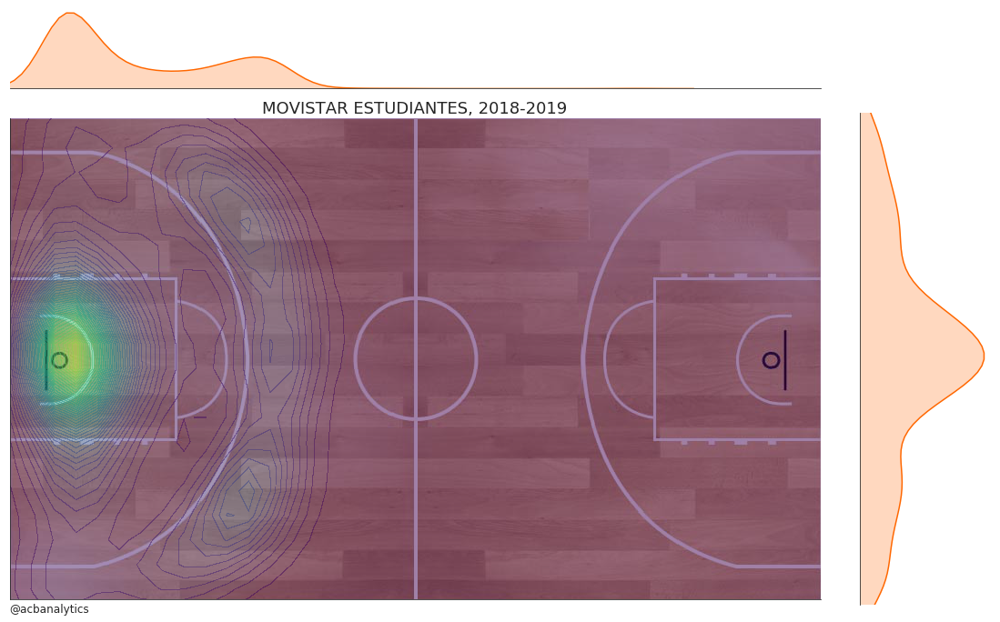

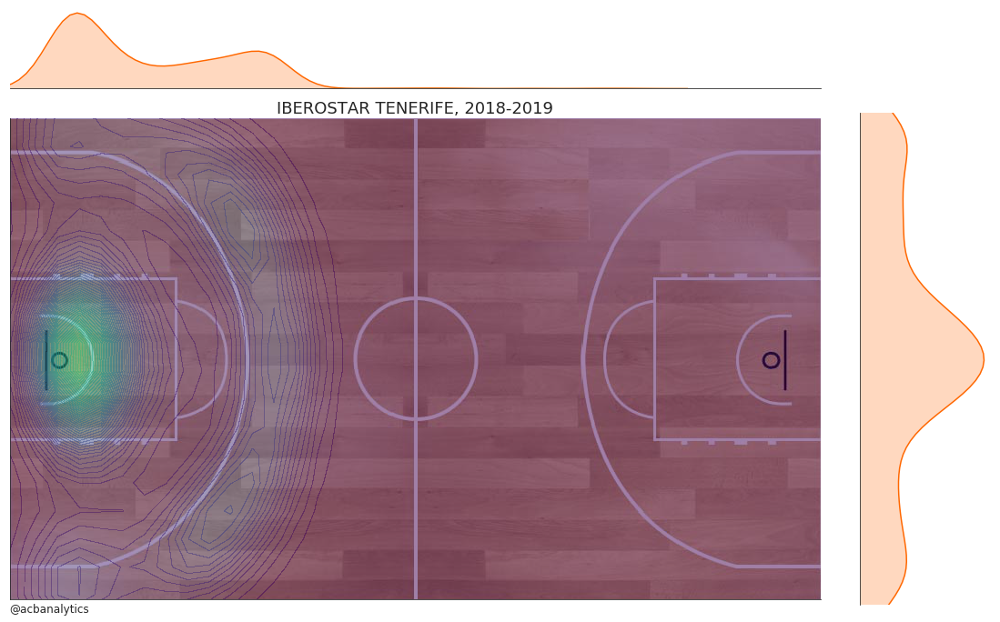

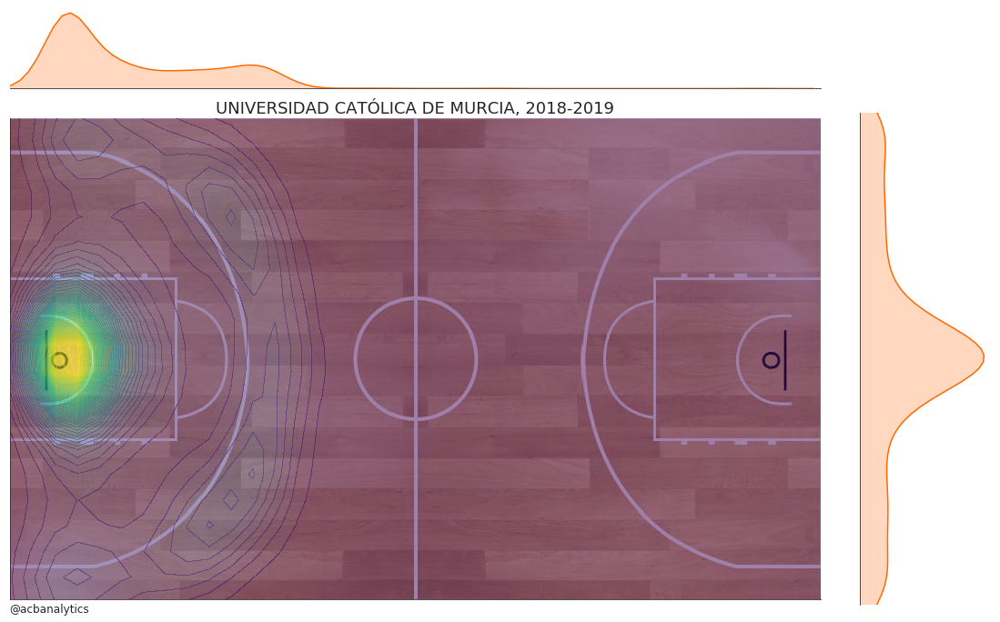

...

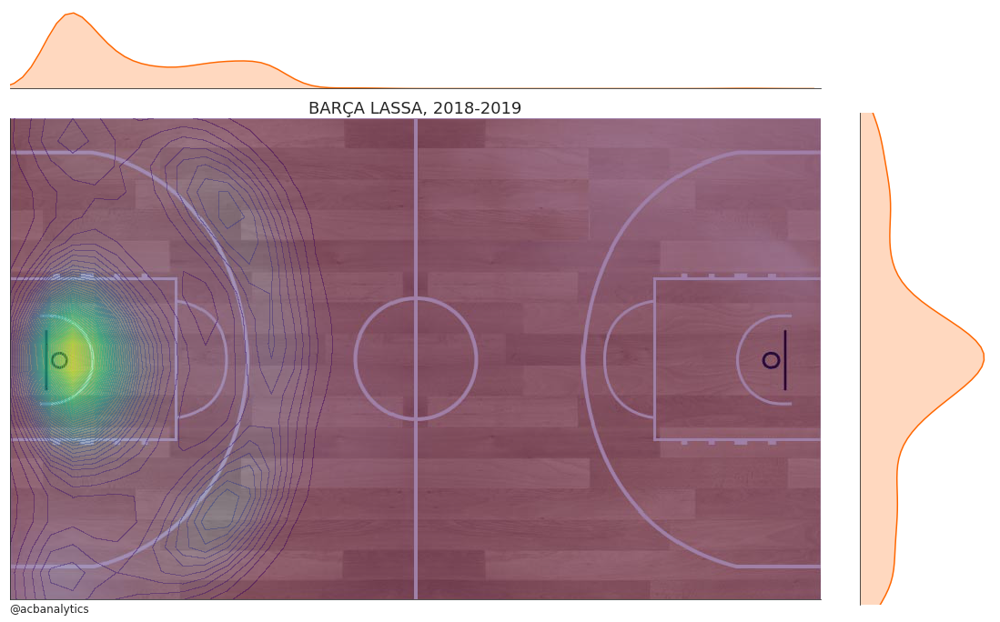

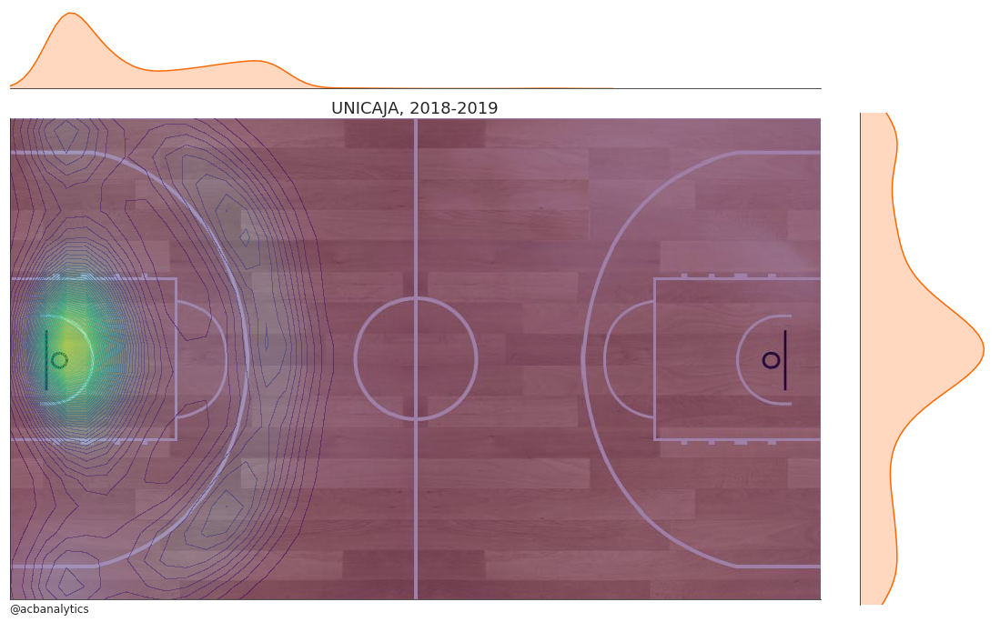

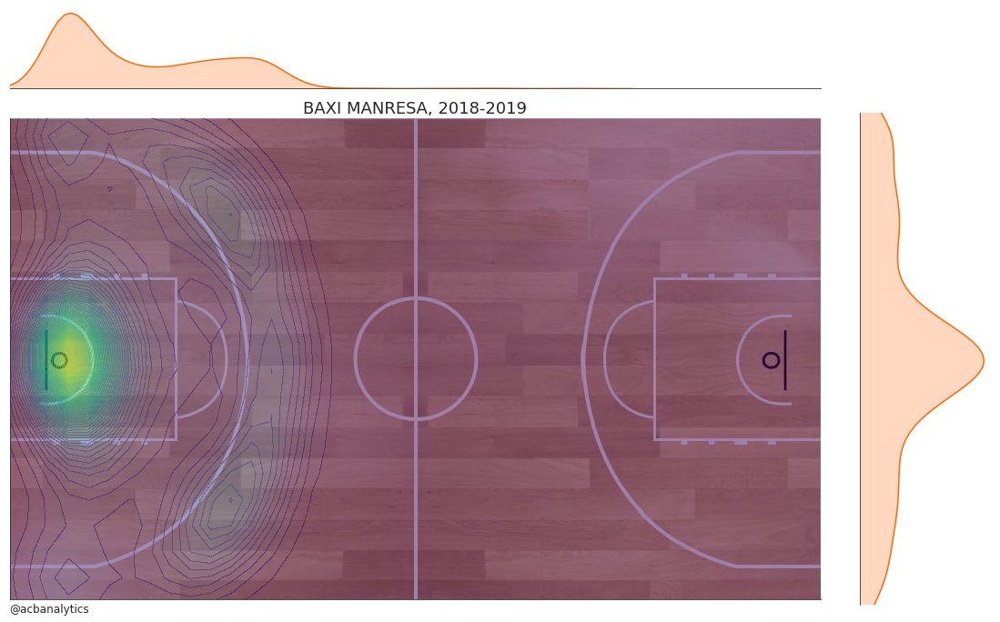

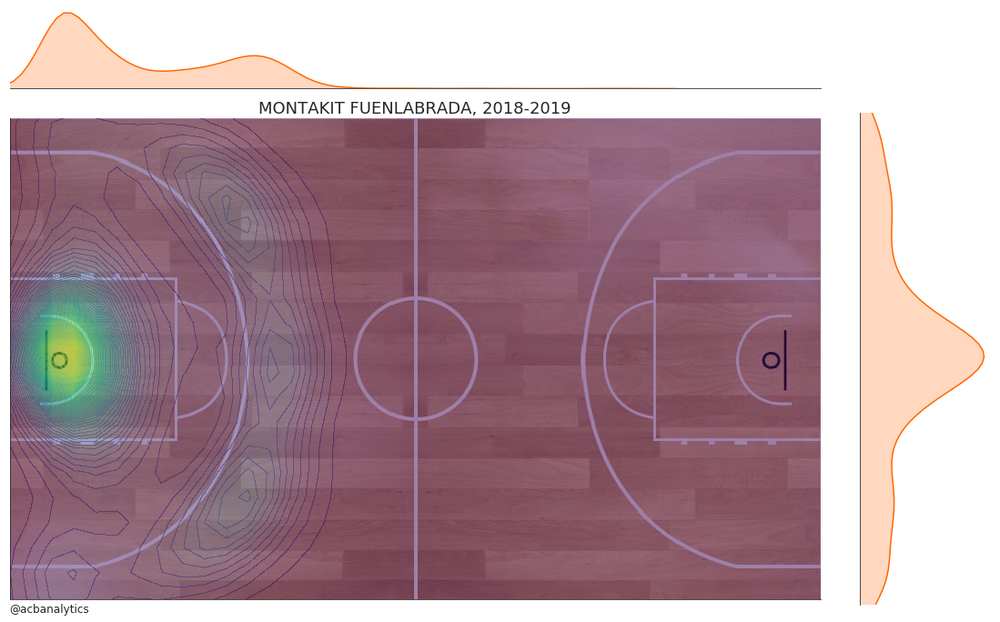

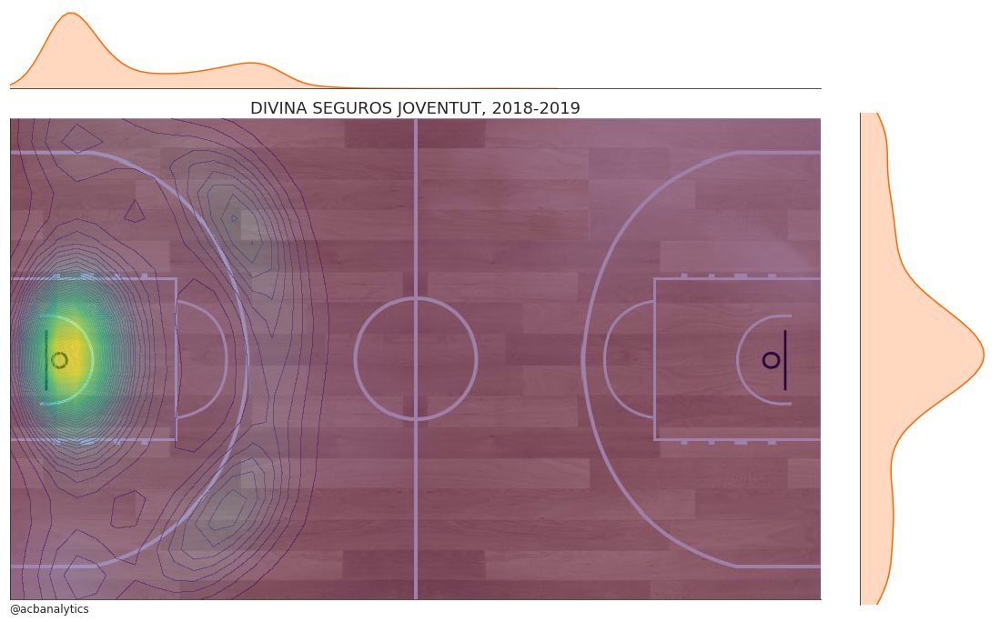

In [120]:
from matplotlib.offsetbox import  OffsetImage
import palettable

df_season=shot_df[(shot_df.game_acbid>=63000)]

teams=df_season['team_id'].unique()
for team in teams:
    # create our jointplot
    aux_df=df_season[(df_season.team_id==team)]
    team_name=team_df.name[(team_df.team_id==team)].iloc[-1]

    # get our colormap for the main kde plot
    # Note we can extract a color from cmap to use for 
    # the plots that lie on the side and top axes
    img=mpimg.imread('fiba_courtonly_cut.png')

    # construct cmap
    # Register and set Viridis as the colormap for the plot
    viridis = ListedColormap(_viridis_data, name='viridis')



    # n_levels sets the number of contour lines for the main kde plot
    joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                    stat_func=None,
                                     kind='kde',space=0.3,color=cmap(0.3),
                                     cmap=viridis, n_levels=50,alpha=0.5,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                     joint_kws={"cut":30,"vmin":0,"vmax":0.0000420})


    
    # A joint plot has 3 Axes, the first one called ax_joint 
    # is the one we want to draw our court onto and adjust some other settings
    ax = joint_shot_chart.ax_joint
    
     # Get rid of axis labels and tick marks
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(labelbottom='off', labelleft='off')
    
    # Add a title
    ax.set_title('{}, 2018-2019'.format(team_name), y=1.2, fontsize=18)
    
    # Add Data Scource and Author
    ax.text(0,-15,'@acbanalytics',fontsize=12)

    ax.imshow(img, origin='lower')
    #plt.title(label=team,fontdict={'fontsize':20},loc="center")
    
    joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
    joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)
    
    plt.show()

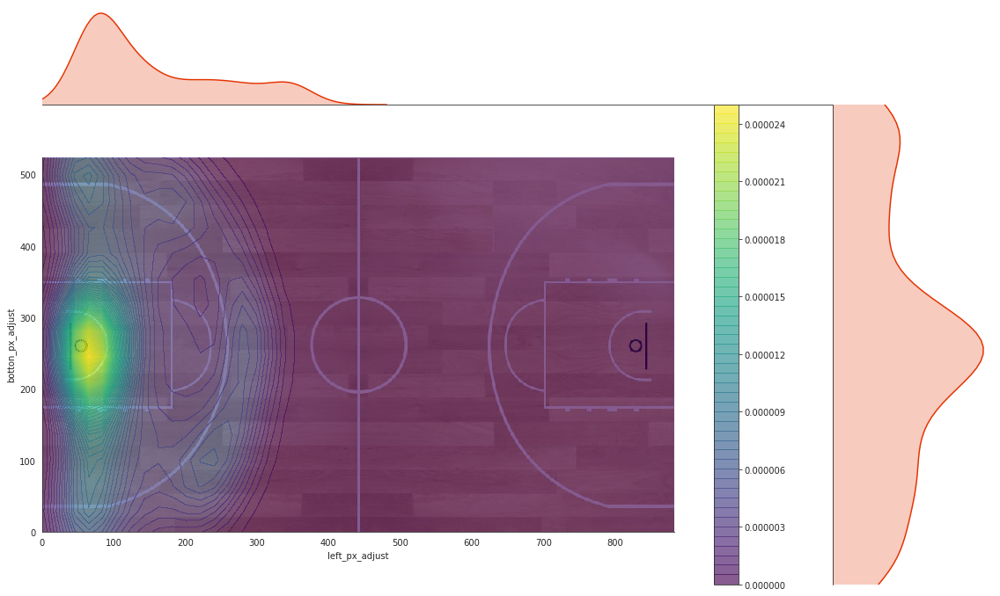

In [117]:
from matplotlib.offsetbox import  OffsetImage
import palettable
from matplotlib.colors import ListedColormap

# create our jointplot
aux_df=shot_df[(shot_df.actor_id==2) ]
aux_df
# get our colormap for the main kde plot
# Note we can extract a color from cmap to use for 
# the plots that lie on the side and top axes
img=mpimg.imread('fiba_courtonly_cut.png')


# construct cmap
# Register and set Viridis as the colormap for the plot
viridis = ListedColormap(_viridis_data, name='viridis')



# n_levels sets the number of contour lines for the main kde plot
joint_shot_chart = sns.jointplot(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100, 
                                stat_func=None,
                                 kind='kde',space=0,color=cmap(0.4),
                                 cmap=viridis, n_levels=50,alpha=0.65,xlim=[0,img.shape[1]],ylim=[0,img.shape[0]],
                                 joint_kws={"cut":30})

joint_shot_chart.fig.set_figwidth(img.shape[1]/100*2)
joint_shot_chart.fig.set_figheight(img.shape[0]/100*2)

# A joint plot has 3 Axes, the first one called ax_joint 
# is the one we want to draw our court onto and adjust some other settings
ax = joint_shot_chart.ax_joint

ax.imshow(img, origin='lower')



plt.show()

In [106]:
aux_df=shot_df[(shot_df.team_id==1) | (shot_df.team_id==2) | (shot_df.team_id==3)
               | (shot_df.team_id==6)| (shot_df.team_id==8)| (shot_df.team_id==9)
               | (shot_df.team_id==13)| (shot_df.team_id==18) & (shot_df.game_acbid>=63000)]

aux_df_final=aux_df.copy()
aux_df_final['left_m_adjust']=(aux_df_final['left_px_adjust']*28)/100
aux_df_final['botton_m_adjust']=(aux_df_final['botton_px_adjust']*15)/100

center=1.575,7.5

aux_df_final['distance']=aux_df_final.apply(lambda row: math.sqrt((row['left_m_adjust']-center[0])**2+(row['botton_m_adjust']-center[1])**2), axis=1)
aux_df_final

actor_dist={}
actors=df_season['actor_id'].unique()
for actor in actors:
    #print(actor)
    
    actor_df=aux_df_final[(aux_df_final.actor_id==actor)]
    actor_df['sum']=1
    suma=actor_df['sum'].sum()
    if suma >= 20:
        actor_dist[actor]=actor_df["distance"].mean()
    
actor_dist

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


{159: 5.2514722574115815,
 163: 4.7488143555195075,
 158: 5.568239446757778,
 28: 4.048093430187039,
 30: 5.82514455439498,
 31: 3.0655432173277717,
 29: 3.3542725501920923,
 34: 5.5284492611747025,
 32: 3.4839409692740615,
 27: 6.885416581920053,
 35: 4.155039225212998,
 36: 6.15743010636053,
 155: 2.6953638735678283,
 209: 4.7840071434508245,
 101: 3.77920936000508,
 201: 2.8415967552469343,
 203: 4.563673382735599,
 205: 6.829172646016692,
 210: 2.03200131275374,
 204: 4.704902288043851,
 202: 5.637768083927964,
 200: 5.672035483400947,
 206: 4.873220452309469,
 24: 5.131154747453483,
 257: 5.599637077284497,
 16: 1.5377120041588852,
 25: 4.909438143911038,
 22: 6.098050035132873,
 261: 6.488557060332731,
 18: 1.3274586452897448,
 19: 5.908412871720578,
 20: 5.448646726676238,
 14: 5.834288051831559,
 122: 5.371326993653556,
 124: 1.1985773762476994,
 152: 3.7308943662658507,
 33: 5.581081903398823,
 10: 2.671214976929994,
 9: 5.417920248411802,
 8: 1.2902237952677975,
 1: 3.9908225

In [24]:
actor_dist
#final_df=pd.DataFrame(actor_dist.items(),columns=['Date', 'DateValue']) 
#final_df
df = pd.DataFrame(list(actor_dist.items()), columns=['actor_id', 'distance'])
df=df.dropna()
df=df.sort_values('distance')
df

,actor_id,distance
85,49,1.113436
115,60,1.116938
34,124,1.198577
46,39,1.247184
104,87,1.269285
39,8,1.290224
29,18,1.327459
59,181,1.332978
114,40,1.379207
49,69,1.388869


Populating the interactive namespace from numpy and matplotlib


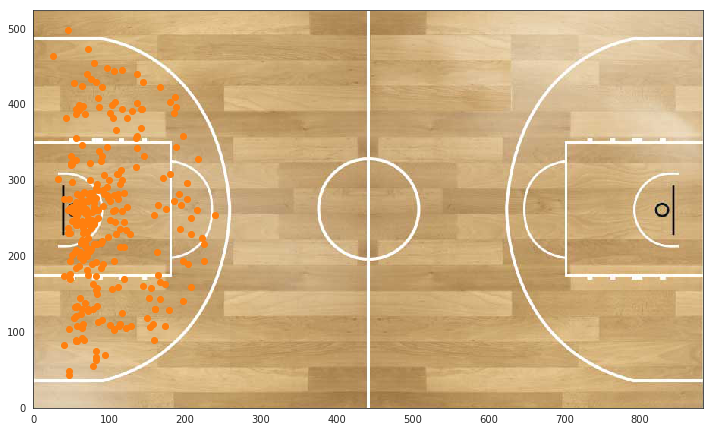

883

In [202]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('fiba_courtonly_cut.png')
aux_df=aux_df[aux_df.distance<=6.75]

plt.figure(figsize=(12,22))
plt.scatter(6*img.shape[1]/100,50*img.shape[0]/100)
plt.scatter(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100)

#plt.scatter(27.14*img.shape[1]/100,22.109*img.shape[0]/100)
#plt.scatter(27.14*img.shape[1]/100,22.109*img.shape[0]/100)

imgplot = plt.imshow(img, origin='lower')
plt.show()
img.shape[0]
img.shape[1]

Populating the interactive namespace from numpy and matplotlib


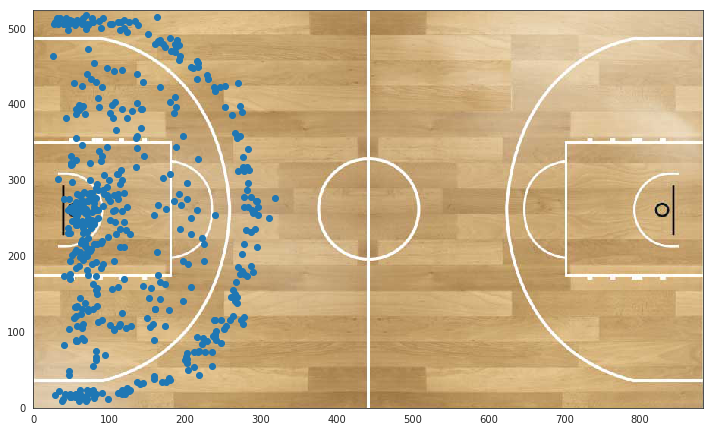

883

In [179]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('fiba_courtonly_cut.png')

aux_df=shot_df[(shot_df.actor_id==2) ]
aux_df

plt.figure(figsize=(12,22))
plt.scatter(aux_df.left_px_adjust*img.shape[1]/100,aux_df.botton_px_adjust*img.shape[0]/100)
imgplot = plt.imshow(img, origin='lower')
plt.show()
img.shape[0]
img.shape[1]

In [97]:
df_mandarinas=shot_df[(shot_df['distance']>=20) & (shot_df['game_acbid']>=63000)]
df_mandarinas

,id,shotchart_game_acbid,game_acbid,team_id,actor_id,jersey,scored,period,shot,shot_type,botton_px,left_px,botton_px_adjust,left_px_adjust,left_m_adjust,botton_m_adjust,distance
475,476,977779,63010,1,4,7,0,1,3PT,None,24.150,14.208,75.850,85.792,24.02176,11.37750,22.779202
5368,5369,977770,63002,6,174,3,0,2,3PT,None,13.265,21.311,86.735,78.689,22.03292,13.01025,21.187009
7184,7185,977999,63136,17,240,40,0,3,3PT,None,11.905,78.142,11.905,78.142,21.87976,1.78575,21.093504
8160,8161,977886,63091,4,100,31,1,1,2PT,layup,57.483,6.922,42.517,93.078,26.06184,6.37755,24.512552
9270,9271,977912,63100,2,63,30,0,1,3PT,None,18.707,89.617,18.707,89.617,25.09276,2.80605,23.981622
10585,10586,978033,63167,8,15,1,0,3,3PT,None,8.503,76.138,8.503,76.138,21.31864,1.27545,20.701602
13862,13863,977976,63126,7,134,9,1,OT,3PT,None,10.544,74.681,10.544,74.681,20.91068,1.58160,20.221177
14148,14149,977832,63061,17,74,23,0,2,2PT,tip,53.741,92.168,53.741,92.168,25.80704,8.06115,24.238537
16427,16428,977801,63032,13,203,8,0,3,3PT,None,10.204,22.951,89.796,77.049,21.57372,13.46940,20.870614
16617,16618,977806,63036,16,112,13,0,2,3PT,None,51.020,83.060,51.020,83.060,23.25680,7.65300,21.682340


Populating the interactive namespace from numpy and matplotlib


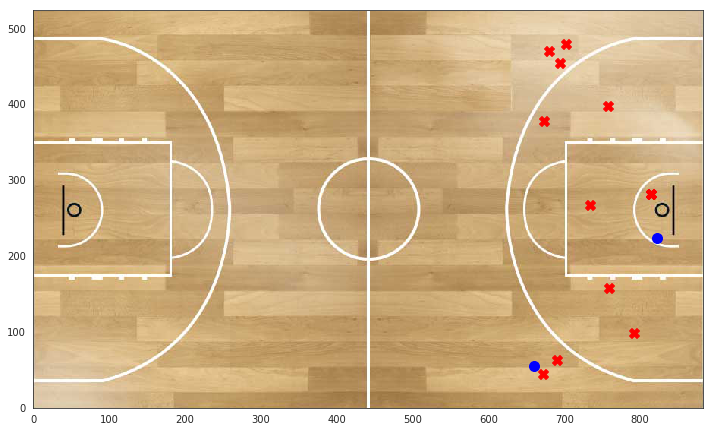

In [103]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('fiba_courtonly_cut.png')

aux1=df_mandarinas[df_mandarinas['scored']==1]
aux2=df_mandarinas[df_mandarinas['scored']==0]
colors1=np.where(aux1.team_id==teams[0],'blue','black')
colors2=np.where(aux2.team_id==teams[0],'blue','black')

plt.figure(figsize=(12,22))
plt.scatter(aux1.left_px_adjust*img.shape[1]/100,aux1.botton_px_adjust*img.shape[0]/100,c="Blue",marker='o',s=100)
plt.scatter(aux2.left_px_adjust*img.shape[1]/100,aux2.botton_px_adjust*img.shape[0]/100,c="red",marker='X',s=100)

imgplot = plt.imshow(img, origin='lower')
plt.show()